In [1]:
import random
import warnings
warnings.filterwarnings('ignore')
import functools
import itertools
from typing import List, Sequence, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rdflib
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.svm import SVC

import sys
sys.path.append('pyRDF2Vec')
sys.path.append('pyRDF2Vec/pyrdf2vec')

from pyrdf2vec import RDF2VecTransformer
from pyrdf2vec.graphs import KG
from pyrdf2vec.embedders import Word2Vec
from pyrdf2vec.walkers import (
    AnonymousWalker,
    CommunityWalker,
    HALKWalker,
    NGramWalker,
    RandomWalker,
    WalkletWalker,
    WLWalker,
)
from pyrdf2vec.samplers import (
    ObjPredFreqSampler,
    PredFreqSampler,
    UniformSampler,
    ObjFreqSampler,
    PageRankSampler,
)

import pickle


In [2]:
from pyrdf2vec.graphs import KG
import pandas as pd
# Load graph
view=3
view_name='VIEW'+str(view)
results = pd.DataFrame()

# Load graph
view_path='/home/khushboo/VIEW3/VIEW'+str(view)+"/"

nodes = pd.read_pickle(view_path+"nodes.pkl")
edges_df = pd.read_pickle(view_path+"edges.pkl")

In [3]:
nodes['name'] = nodes['name'].apply(lambda x: x.replace('<', '').replace('>', ''))


nodes

,name,type
0,http://purl.obolibrary.org/obo/HP_0010945,Phenotype
1,https://www.mirbase.org/mature/MIMAT0027026,miRNA
2,http://purl.obolibrary.org/obo/MONDO_0000996,Disease
3,http://purl.obolibrary.org/obo/UBERON_0003831,Anatomy
4,https://www.mirbase.org/hairpin/MI0031521,miRNA
...,...,...
87352,http://purl.obolibrary.org/obo/MONDO_0021636,Disease
87353,http://purl.obolibrary.org/obo/MONDO_0012749,Disease
87354,http://www.ncbi.nlm.nih.gov/gene/80099,Gene
87355,http://purl.obolibrary.org/obo/HP_0100788,Phenotype


In [4]:
edges_df['subject'] = edges_df['subject'].apply(lambda x: x.replace('<', '').replace('>', ''))

edges_df['predicate'] = edges_df['predicate'].apply(lambda x: x.replace('<', '').replace('>', ''))
edges_df['object'] = edges_df['object'].apply(lambda x: x.replace('<', '').replace('>', ''))

In [5]:
entities= nodes['name']
sorted(entities)[:5]

['http://purl.obolibrary.org/obo/BFO_0000001',
 'http://purl.obolibrary.org/obo/CHEBI_10545',
 'http://purl.obolibrary.org/obo/CHEBI_11596',
 'http://purl.obolibrary.org/obo/CHEBI_11851',
 'http://purl.obolibrary.org/obo/CHEBI_11955']

In [6]:
kg = KG('/home/khushboo/VIEW3/VIEW3/KG.nt')
kg

KG(location='/home/khushboo/VIEW3/VIEW3/KG.nt', skip_predicates=set(), literals=[], fmt=None, mul_req=False, skip_verify=False, cache=TTLCache({}, maxsize=1024, currsize=0), _is_remote=False)

In [7]:
list(kg._entities)[:5]

[Vertex(name='https://www.mirbase.org/hairpin/MI0019312'),
 Vertex(name='http://purl.obolibrary.org/obo/HP_0004059'),
 Vertex(name='http://www.ncbi.nlm.nih.gov/gene/83888'),
 Vertex(name='http://purl.obolibrary.org/obo/MONDO_0003963'),
 Vertex(name='http://purl.obolibrary.org/obo/GO_0003105')]

In [8]:
len(kg._entities)

87357

In [9]:
from pyrdf2vec.graphs.vertex import Vertex
entities_vertex = []
for i in entities:
    entities_vertex.append(Vertex(name=i))
entities_vertex = set(entities_vertex)
len(entities_vertex)

87357

In [10]:
[e for e in entities_vertex if e not in kg._entities]

[]

In [11]:
filtered_entities = [e for e in entities_vertex if e not in kg._entities]
not_found = list(set(filtered_entities))
print(f'{not_found} could not be found in the KG! Removing them...')
entities_vertex = set(entities_vertex) - set(filtered_entities)

[] could not be found in the KG! Removing them...


In [12]:
new_entities = []
for i in entities_vertex:
    new_entities.append(i.name)

In [13]:
entities = new_entities

In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix

def classify(walk_embeddings):
  for task in ['type']:

    # Split our data into train and test (50/50 split)
    data = train_test_split(nodes['name'], nodes[task],
                            stratify=nodes[task], test_size=0.5,
                            random_state=42)
    train_ent, test_ent, y_train, y_test = data

    # Create masks that filter out all entities that are INCLUDED in the KG.
    train_mask = [x in entities for x in train_ent]
    test_mask = [x in entities for x in test_ent]
    y_train = y_train[train_mask]
    y_test = y_test[test_mask]

    # Create our X_train and X_test which consists out of the created embeddings
    X_train = []
    X_test = []
    for entity in train_ent:
      if entity in entities:
        X_train.append(walk_embeddings[entities.index(entity)])
    for entity in test_ent:
      if entity in entities:
        X_test.append(walk_embeddings[entities.index(entity)])
    X_train = np.array(X_train)
    X_test = np.array(X_test)

    # Fit a Random Forest & tune some of its hyper-parameters
    rf = GridSearchCV(RandomForestClassifier(random_state=42),
                      {'n_estimators': [10, 50, 100], 'max_depth': [3, 5, None]},
                      cv=10)
    rf.fit(X_train, y_train)
    preds = rf.predict(X_test)

    # Evaluate our model on the test data
    print(task)
    print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
    print('Accuracy =', accuracy_score(y_test, preds))
    print(confusion_matrix(y_test, preds))
    print()

In [15]:
from pyrdf2vec.embedders import Word2Vec
transformer = RDF2VecTransformer(walkers=[RandomWalker(2,None)],embedder=Word2Vec(vector_size=500))
walk_embeddings = transformer.fit_transform(kg, entities)

In [16]:
walk_embeddings

([array([ 1.97084863e-02,  2.87635941e-02, -3.51282284e-02,  8.84866714e-02,
          1.80216625e-01,  1.46617800e-01,  3.46289486e-01,  3.27783823e-01,
          2.41373926e-01,  3.12702134e-02,  1.67858601e-01, -1.20521732e-01,
          4.08068508e-01,  4.85155545e-02, -1.18021011e-01, -3.81465778e-02,
         -5.06937690e-02, -1.42183378e-01, -1.67672366e-01, -9.74298641e-02,
          1.26222791e-02, -5.00314355e-01,  1.03042156e-01, -2.22998470e-01,
          9.41469297e-02, -7.99942091e-02,  7.33527988e-02, -7.40767419e-02,
         -3.69317876e-03, -7.27542117e-02, -1.12843752e-01, -1.20912753e-01,
         -3.38093787e-01,  1.58644110e-01, -8.13399181e-02,  1.33642048e-01,
         -1.05300382e-01,  3.79839897e-01,  9.72051248e-02,  1.77359655e-01,
          1.15141958e-01, -1.78552702e-01, -9.61592197e-02,  7.60938674e-02,
          9.19490531e-02,  5.29763997e-01, -1.69284672e-01,  3.50926220e-02,
          9.24761519e-02,  3.86354178e-01, -2.76205521e-02,  3.71243209e-01,

In [17]:
entity_embeddings = {entity: walk_embeddings[0][i] for i, entity in enumerate(entities)}

In [18]:
walk_embeddings_df  = pd.DataFrame(entity_embeddings)

In [19]:
walk_embeddings_df.columns = walk_embeddings_df.iloc[0]
walk_embeddings_df = walk_embeddings_df[1:]

In [20]:
walk_embeddings_df

,0.019708,0.006286,0.018452,-0.000527,0.008611,0.300803,0.147108,-0.160435,0.005169,0.003728,...,0.000335,-0.009867,0.325680,0.076203,-0.003487,-0.000802,0.020968,0.012649,0.316861,0.008537
1,0.028764,0.021946,0.068599,0.002340,0.054335,1.807291,0.134501,0.608767,0.050253,-0.024936,...,0.021219,-0.054237,0.012093,0.083899,0.024870,0.003346,0.174229,-0.021456,0.064639,0.047686
2,-0.035128,-0.011156,0.017314,-0.003333,-0.027641,-0.405665,0.051913,-0.794637,0.000369,-0.064186,...,-0.008111,-0.138981,0.103400,-0.073039,-0.025683,0.001851,0.162933,0.025427,-0.034495,-0.063105
3,0.088487,0.008252,0.020078,-0.000890,0.020209,1.493929,0.143870,1.082974,-0.002702,0.040576,...,0.014789,0.078784,0.188153,-0.019962,-0.001331,0.000002,0.008265,0.005793,0.399759,0.069352
4,0.180217,0.040239,0.024898,0.001341,0.065870,1.137513,-0.162398,-0.109835,0.036219,0.175211,...,0.019394,0.162310,0.468069,-0.054813,0.036185,0.003119,0.120516,-0.001050,-0.537047,-0.679135
5,0.146618,0.010053,-0.020456,-0.002656,0.018890,0.261887,-0.089398,0.657639,-0.076432,0.025178,...,0.010679,0.185543,-0.249618,-0.071292,0.014945,-0.000410,-0.125308,-0.008287,-0.382568,-0.202494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.257562,0.000341,0.033482,0.000962,-0.007377,-0.427343,0.032467,0.370912,-0.003590,-0.029067,...,0.009219,0.022267,0.167077,0.048601,0.008457,0.001506,-0.004168,-0.013420,0.004726,0.036227
496,-0.424354,0.015001,-0.038311,0.001931,0.007367,0.764479,-0.133336,-0.705729,-0.026363,-0.022165,...,-0.006565,0.049626,-0.481155,-0.004832,-0.010453,-0.001994,-0.011325,-0.015975,-0.318619,-0.318044
497,-0.044184,0.004270,0.066774,-0.000800,-0.010707,-1.150375,0.345263,0.333753,0.011562,-0.008614,...,0.005944,0.286092,-0.454668,0.002648,0.004889,0.003442,-0.016474,0.015311,0.005302,0.225215
498,0.101738,0.009798,0.042582,-0.002014,-0.028200,0.293944,0.297793,-0.087326,-0.014948,0.004345,...,-0.005439,0.177552,-0.006394,-0.076858,-0.017508,-0.000648,-0.017910,0.029661,0.278211,0.472831


In [21]:
desired_dim =50
# Convert the dictionary 'data' into a pandas DataFrame
data = ()
df = pd.DataFrame(data)

# Set the index of the DataFrame
df.index = entities

# Flatten the first 'desired_dim' embedding vectors into separate columns
for i in range(desired_dim):
    df[f'{i}'] = [embedding[:desired_dim][i] for embedding in entity_embeddings.values()]


# Show the DataFrame
print(df)


                                                     0         1         2  \
https://www.mirbase.org/hairpin/MI0019312     0.019708  0.028764 -0.035128   
http://purl.obolibrary.org/obo/HP_0004059     0.006286  0.021946 -0.011156   
http://www.ncbi.nlm.nih.gov/gene/83888        0.018452  0.068599  0.017314   
http://purl.obolibrary.org/obo/MONDO_0003963 -0.000527  0.002340 -0.003333   
http://purl.obolibrary.org/obo/GO_0003105     0.008611  0.054335 -0.027641   
...                                                ...       ...       ...   
http://purl.obolibrary.org/obo/MONDO_0007905 -0.000802  0.003346  0.001851   
http://purl.obolibrary.org/obo/MONDO_0016193  0.020968  0.174229  0.162933   
http://purl.obolibrary.org/obo/HP_6000079     0.012649 -0.021456  0.025427   
http://www.ncbi.nlm.nih.gov/gene/59340        0.316861  0.064639 -0.034495   
http://www.ncbi.nlm.nih.gov/gene/23011        0.008537  0.047686 -0.063105   

                                                     3         

In [24]:
df.to_csv('view3_rdf2vec_embeddings.csv')


In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def visualize(h, node_types):
    z = TSNE(n_components=2).fit_transform(h)

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])
    unique_node_types = np.unique(node_types)
    palette = sns.color_palette("tab20", len(unique_node_types))

    # Create a dictionary mapping each node type to a color
    node_type_to_color = {node_type: palette[i] for i, node_type in enumerate(unique_node_types)}

    # Map the colors for each node based on its type
    node_colors = [node_type_to_color[node_type] for node_type in node_types]
    scatter = plt.scatter(z[:, 0], z[:, 1], s=70, c=node_colors, cmap="tab20")




    # Create legend manually
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
               for color in palette]
    plt.legend(handles, unique_node_types, title="Node Types", loc='best')
    plt.show()

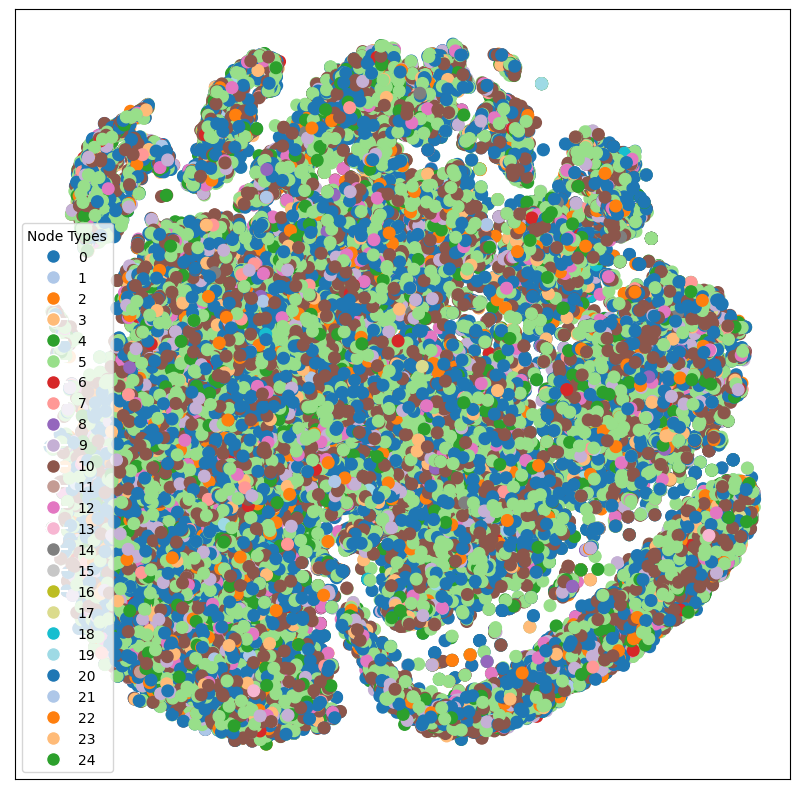

In [31]:
label_encoder = LabelEncoder()
nodes_type_encoded = label_encoder.fit_transform(nodes.type)

visualize(df, nodes_type_encoded)

In [30]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Prepare the labels
true_labels = nodes['type']

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Prepare the features and labels
X = df.values
y = true_labels

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

In [33]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

Accuracy: 0.2530
Precision: 0.1834
Recall: 0.2530


In [34]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Prepare the features and labels
X = df.values
y = true_labels

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.25751678876678874
Classification Report:
                           precision    recall  f1-score   support

                  Anatomy       0.07      0.00      0.00      1772
                     Cell       0.00      0.00      0.00       364
                 Chemical       0.00      0.00      0.00       661
               Chromosome       0.00      0.00      0.00        93
                  Disease       0.28      0.60      0.38      7344
              Environment       0.00      0.00      0.00       141
   Environmental exposure       0.00      0.00      0.00       131
                     Food       0.00      0.00      0.00        50
                       GO       0.00      0.00      0.00      1169
                     Gene       0.22      0.21      0.22      5831
  General medical science       0.00      0.00      0.00         2
          Genomic feature       0.00      0.00      0.00       742
Human developmental stage       0.00      0.00      0.00        19
        

In [36]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

selected_classes = ['miRNA', 'Gene', 'Disease']

filtered_embeddings = []
filtered_labels = []


for class_label in selected_classes:

    class_indices = nodes[nodes['type'] == class_label].index


    class_embeddings = df.iloc[class_indices, 1:].values  # Skip the first column with identifiers

    # Append the filtered embeddings and labels
    filtered_embeddings.append(class_embeddings)
    filtered_labels.extend([class_label] * len(class_embeddings))


X_filtered = np.vstack(filtered_embeddings)

# Encode the labels
le = LabelEncoder()
y_filtered = le.fit_transform(filtered_labels)  # Convert the labels into numerical form


X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.3, random_state=42)

clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

precision_per_class = precision_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))
recall_per_class = recall_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))

for i, class_label in enumerate(le.classes_):
    if class_label in selected_classes:
        print(f"Class: {class_label}")
        print(f"  Precision: {precision_per_class[i]:.4f}")
        print(f"  Recall: {recall_per_class[i]:.4f}")


Accuracy: 0.4748
Precision: 0.4079
Recall: 0.4748
Class: Disease
  Precision: 0.4999
  Recall: 0.7642
Class: Gene
  Precision: 0.3932
  Recall: 0.2295
Class: miRNA
  Precision: 0.0000
  Recall: 0.0000


In [22]:
# basics
import numpy as np
import pandas as pd
import tensorflow as tf

# math
from math import ceil
from math import log
from math import log10

# utils
import itertools as it
import time
#from varname import nameof # get the name of a variable
import pickle
from tqdm.auto import tqdm, trange
#from tqdm import tqdm  RuntimeError: CUDA error: device-side assert triggered
import inspect
from grape.datasets.linqs import get_words_data # words information is excluded
from sklearn.preprocessing import LabelEncoder


# plot
import matplotlib as mpl
import matplotlib.pyplot as plt
import tikzplotlib
#from barplots import barplots
import matplotlib.colors as colors
import seaborn as sns
from sklearn.manifold import TSNE


# torch geometrics
import torch
import torch.optim as optim

from torch_geometric.datasets import FB15k_237
from torch_geometric.nn import ComplEx, DistMult, RotatE, TransE
from torch_geometric.data import Data

import os.path as osp

# Convolutional GNN
import torch_geometric.transforms as T

from torch_geometric.datasets import Planetoid
from torch_geometric.nn import GCNConv
from torch_geometric.utils import negative_sampling
from torch_geometric.loader import LinkNeighborLoader
from torch_geometric.transforms import RandomLinkSplit

from sklearn.metrics import roc_auc_score
# # Grape

2024-11-15 17:58:56.990854: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-15 17:58:57.035216: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-15 17:58:57.621860: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [23]:
# # Grape
# from grape.datasets import get_all_available_graphs_dataframe
# from grape.datasets import get_dataset
from grape import Graph
from grape import GraphVisualizer

# # Ensmallen
# from grape.embedders import Node2VecCBOWEnsmallen, Node2VecGloVeEnsmallen, Node2VecSkipGramEnsmallen
# from grape.embedders import DeepWalkCBOWEnsmallen, DeepWalkGloVeEnsmallen, DeepWalkSkipGramEnsmallen
# from grape.embedders import WalkletsSkipGramEnsmallen, WalkletsCBOWEnsmallen, WalkletsGloVeEnsmallen
# from grape.embedders import FirstOrderLINEEnsmallen, SecondOrderLINEEnsmallen
# #from grape.embedders import NetMFEnsmallen, GLEEEnsmallen, HOPEEnsmallen
from grape.embedders import TransEEnsmallen

# # TensorFlow
# from grape.embedders import SkipGramTensorFlow, CBOWTensorFlow
# from grape.embedders import FirstOrderLINETensorFlow, SecondOrderLINETensorFlow

# # KarateClub
# from grape.embedders import Role2VecKarateClub, GraRepKarateClub
# from grape.embedders import NMFADMMKarateClub, RandNEKarateClub


# # Edge prediction evaluation
from grape.edge_prediction import edge_prediction_evaluation
from grape.edge_prediction import DecisionTreeEdgePrediction, RandomForestEdgePrediction, ExtraTreesEdgePrediction, MLPEdgePrediction, GradientBoostingEdgePrediction,PerceptronEdgePrediction

# from grape.edge_prediction import KipfGCNEdgePrediction

# # Node Label prediction evaluation
# from grape.node_label_prediction import node_label_prediction_evaluation
# from grape.node_label_prediction import DecisionTreeNodeLabelPrediction, RandomForestNodeLabelPrediction, MLPNodeLabelPrediction, GradientBoostingNodeLabelPrediction#, PerceptronNodeLabelPrediction

In [24]:
from grape import Graph # type: ignore
rna_kg_graph = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=False,
    name=view_name,
)

rna_kg_graph_directed = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=True,
    name=view_name+"_directed",
)

In [25]:
graph = rna_kg_graph_directed
# Function to simplify node names
def simplify_node_names(graph):
    simplified_node_names = [name[0] for name in graph.get_node_names()]
    return simplified_node_names

# Apply to the graph
simplified_node_names = simplify_node_names(graph)

In [39]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[RandomForestEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False,
    enable_cache=False
)

In [40]:
results = pd.concat([results, evaluation], ignore_index = True)
filename = "results_"+view_name+"_FirstOrderLINE_rdf2vec.csv"
results.to_csv(filename)

In [41]:
results

,evaluation_mode,train_size,validation_unbalance_rate,use_scale_free_distribution,prevalence,markedness,fowlkes_mallows_index,informedness,negative_likelyhood_ratio,accuracy,...,"(model_parameters, max_features)","(model_parameters, max_leaf_nodes)","(model_parameters, min_impurity_decrease)","(model_parameters, bootstrap)","(model_parameters, oob_score)","(model_parameters, n_jobs)","(model_parameters, verbose)","(model_parameters, warm_start)","(model_parameters, ccp_alpha)","(model_parameters, max_samples)"
0,train,0.8,1.0,True,0.5,0.017701,0.269118,0.008340,0.990390,0.504170,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
1,test,0.8,1.0,True,0.5,0.009971,0.263720,0.004641,0.994653,0.502320,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
2,train,0.8,1.0,True,0.5,0.014843,0.276808,0.007393,0.991383,0.503696,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
3,test,0.8,1.0,True,0.5,0.009587,0.273817,0.004758,0.994449,0.502379,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
4,train,0.8,1.0,True,0.5,0.012021,0.294066,0.006664,0.992040,0.503332,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
5,test,0.8,1.0,True,0.5,0.004611,0.288686,0.002531,0.996977,0.501265,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
6,train,0.8,1.0,True,0.5,0.014456,0.273050,0.007044,0.991824,0.503522,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
7,test,0.8,1.0,True,0.5,0.008261,0.270231,0.004026,0.995319,0.502013,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
8,train,0.8,1.0,True,0.5,0.013259,0.283959,0.006920,0.991851,0.503460,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
9,test,0.8,1.0,True,0.5,0.008872,0.280873,0.004602,0.994580,0.502301,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None


In [26]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[DecisionTreeEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False
)


In [27]:
results = evaluation
filename = "results_"+view_name+"_FirstOrderLINE_DesicionTree_rdf2vec.csv"
results.to_csv(filename)

In [28]:
results

,evaluation_mode,train_size,validation_unbalance_rate,use_scale_free_distribution,informedness,recall,balanced_accuracy,threat_score,precision,prevalence,...,"(model_parameters, criterion)","(model_parameters, splitter)","(model_parameters, max_depth)","(model_parameters, min_samples_split)","(model_parameters, min_samples_leaf)","(model_parameters, min_weight_fraction_leaf)","(model_parameters, max_features)","(model_parameters, max_leaf_nodes)","(model_parameters, min_impurity_decrease)","(model_parameters, ccp_alpha)"
0,train,0.8,1.0,True,0.000095,0.073775,0.500047,0.068713,0.500322,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.8,1.0,True,-0.000079,0.073562,0.499960,0.068516,0.499730,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.8,1.0,True,0.000660,0.129507,0.500330,0.114725,0.501277,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.8,1.0,True,-0.000494,0.129188,0.499753,0.114358,0.499045,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.8,1.0,True,-0.001805,0.123830,0.499098,0.110009,0.496383,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.8,1.0,True,-0.002369,0.123724,0.498816,0.109870,0.495259,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.8,1.0,True,-0.001337,0.147753,0.499331,0.128582,0.497747,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.8,1.0,True,-0.001521,0.146871,0.499239,0.127893,0.497424,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
0,train,0.8,1.0,True,0.002196,0.176398,0.501098,0.150228,0.503132,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0
1,test,0.8,1.0,True,0.003776,0.177749,0.501888,0.151408,0.505367,0.5,...,gini,best,10,2,1,0.0,sqrt,None,0.0,0.0


In [29]:
# Separate train and test results
train_results = evaluation[evaluation['evaluation_mode'] == 'train']
test_results = evaluation[evaluation['evaluation_mode'] == 'test']

# Function to compute mean metrics for a given evaluation mode
def compute_mean_metrics(data, mode):
    results = []
    for holdout in data['holdout_number'].unique():
        holdout_data = data[data['holdout_number'] == holdout]

        # Calculate mean values for metrics
        auc_score = holdout_data['auroc'].mean()
        precision = holdout_data['precision'].mean()
        recall = holdout_data['recall'].mean()
        f1_score = holdout_data['f1_score'].mean()
        accuracy = holdout_data['accuracy'].mean()  # Assuming 'accuracy' column exists

        # Append results for this holdout
        results.append({
            'Holdout': holdout,
            'AUC': auc_score,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1_score,
            'Accuracy': accuracy
        })

    # Convert to DataFrame
    return pd.DataFrame(results)

# Compute metrics for train and test
train_metrics_df = compute_mean_metrics(train_results, 'Train')
test_metrics_df = compute_mean_metrics(test_results, 'Test')    

# Calculate overall mean for train and test
overall_train_mean = train_metrics_df.mean(numeric_only=True)
overall_test_mean = test_metrics_df.mean(numeric_only=True)

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Evaluation Mode': ['Train', 'Test'],
    'AUC': [overall_train_mean['AUC'], overall_test_mean['AUC']],
    'Precision': [overall_train_mean['Precision'], overall_test_mean['Precision']],
    'Recall': [overall_train_mean['Recall'], overall_test_mean['Recall']],
    'F1 Score': [overall_train_mean['F1 Score'], overall_test_mean['F1 Score']],
    'Accuracy': [overall_train_mean['Accuracy'], overall_test_mean['Accuracy']]
})

# Display the summary of mean metrics
print(summary_df)


  Evaluation Mode       AUC  Precision    Recall  F1 Score  Accuracy
0           Train  0.511346   0.499772  0.130253  0.204343  0.499981
1            Test  0.510757   0.499365  0.130219  0.204251  0.499931
